<a href="https://colab.research.google.com/github/nerbivol/Intelligent_Decision_Support_Systems/blob/main/Damage_building.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%env SM_FRAMEWORK=tf.keras
!pip install segmentation-models==1.0.1

env: SM_FRAMEWORK=tf.keras
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 KB 8.2 MB/s eta 0:00:00


In [2]:
import os
import pandas as pd
import numpy as np
import cv2
import glob
from PIL import Image
import matplotlib.pyplot as plt
from pathlib import Path
import logging
import datetime

import tensorflow as tf
from tensorflow.data import Dataset

from segmentation_models import Unet

Segmentation Models: using `tf.keras` framework.


In [3]:
# checking availability of GPU resources
tf.config.list_physical_devices('GPU') 

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [4]:
image_path = "/content/drive/MyDrive/Colab Data/Building Damage/train/images"
label_path = "/content/drive/MyDrive/Colab Data/Building Damage/train/labels"
mask_path = "/content/drive/MyDrive/Colab Data/Building Damage/train/targets"

pre_image = sorted(glob.glob(os.path.join(image_path, "*pre*")))
post_image = sorted(glob.glob(os.path.join(image_path, "*post*")))

pre_label = sorted(glob.glob(os.path.join(label_path, "*pre*")))
post_label = sorted(glob.glob(os.path.join(label_path, "*post*")))

pre_mask = sorted(glob.glob(os.path.join(mask_path, "*pre*")))
post_mask = sorted(glob.glob(os.path.join(mask_path, "*post*")))

In [5]:
print("Pre images: ", len(pre_image))
print("Post images: ", len(post_image))
print("Pre labels: ", len(pre_label))
print("Post labels: ", len(post_label))
print("Pre masks: ", len(pre_mask))
print("Post masks: ", len(post_mask))

Pre images:  2799
Post images:  2799
Pre labels:  2799
Post labels:  2799
Pre masks:  2813
Post masks:  2814


In [6]:
# import shutil
# source_folder = "/content/drive/MyDrive/Colab Data/Building Damage/train/images/post/"
# destination_folder = "/content/drive/MyDrive/Colab Data/Building Damage/train/images/"

# for file_name in os.listdir(source_folder):
#     # construct full file path
#     source = source_folder + file_name
#     destination = destination_folder + file_name
#     # move only files
#     if os.path.isfile(source):
#         shutil.move(source, destination)
#         print('Moved:', file_name)

In [7]:
def read_image_rgb(fname):
    image = np.array(cv2.imread(fname)[..., ::-1])
    if image is None:
        raise FileNotFoundError(fname)
    return image


In [8]:
def read_mask(fname):
    mask = np.array(Image.open(str(fname)))
    if len(mask.shape) == 3:
        mask = np.squeeze(mask, axis=-1)

    return mask

In [9]:
def overlay_damage_mask(image, mask):
    overlay = image.copy()
    overlay[mask == 1] = (0,   255, 0) # Regular buildingn are green
    overlay[mask == 2] = (255, 255, 0) # Destroyed buildings are yellow
    overlay[mask == 3] = (255,  150, 0) # Destroyed buildings are orange
    overlay[mask == 4] = (255,   0, 0) # Destroyed buildings are red
    return cv2.addWeighted(overlay, 0.5, image, 0.5, 0, dtype=cv2.CV_8U)

In [10]:
def plot_satellite_images(idx=0):
    f, ax = plt.subplots(1,3, figsize=(30,9))
    ax[0].imshow(read_image_rgb(pre_image[idx]))
    ax[0].axis('off')
    ax[1].imshow(read_image_rgb(post_image[idx]))
    ax[1].axis('off')
    ax[2].imshow(overlay_damage_mask(
        read_image_rgb(post_image[idx]),
        read_mask(post_mask[idx])
    ))
    ax[2].axis('off')
    f.tight_layout()
    f.show()

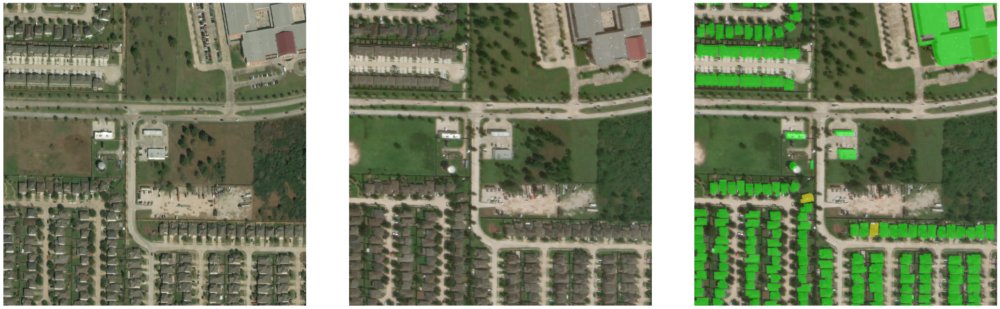

In [11]:
plot_satellite_images(400)

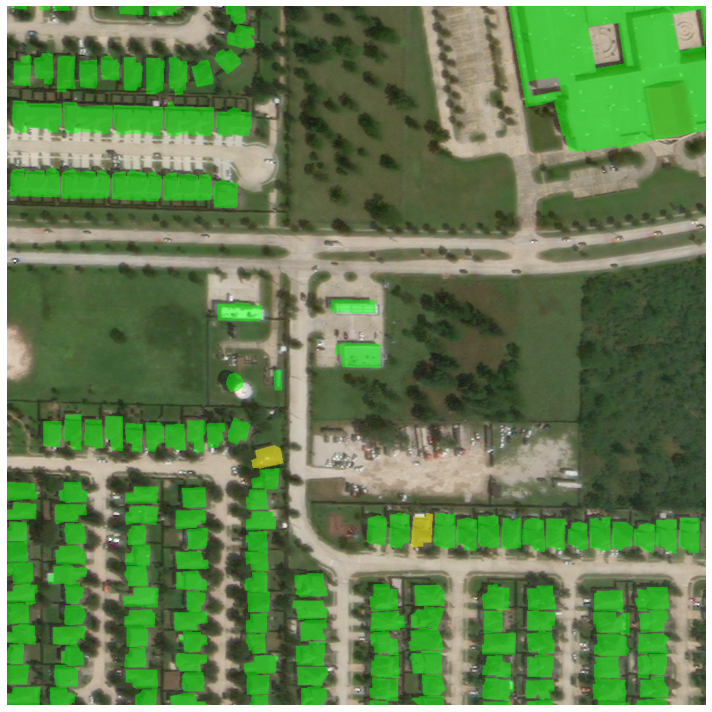

In [12]:
def show_image(image):
    plt.figure(figsize=(10,10))
    plt.imshow(image)
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    
sample_image = read_image_rgb(post_image[400])
sample_mask = read_mask(post_mask[400])

show_image(overlay_damage_mask(sample_image, sample_mask))

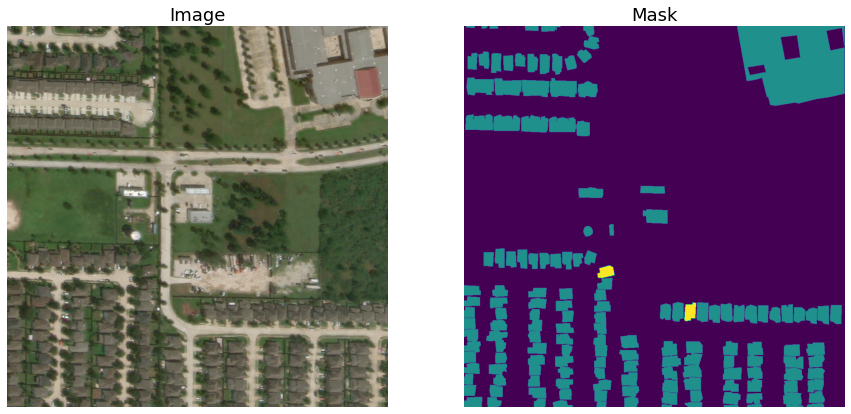

In [13]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 8))

ax1.axis("off")
ax1.set_title("Image", fontsize=18)
ax1.imshow(sample_image)

ax2.axis("off")
ax2.set_title("Mask", fontsize=18)
ax2.imshow(sample_mask)
plt.show()

## Applying augmentation 

In [14]:
tf.function
def load_img_with_mask(image_path) -> dict:
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=3)

    mask_filename = tf.strings.regex_replace(image_path, 'images', 'targets')
    mask_filename = tf.strings.regex_replace(mask_filename, '.png', '_target.png')
    mask = tf.io.read_file(mask_filename)
    mask = tf.image.decode_png(mask, channels=1)
    return (image, mask)

# normalize values in range [0, 1]
@tf.function
def normalize_values(images, masks):
    images = tf.math.divide(images, 255)
    masks = tf.cast(masks, tf.float32)
    return (images, masks)

In [16]:
AUTOTUNE = tf.data.experimental.AUTOTUNE

def pipeline(list, batchs=1):
  dataset = Dataset.list_files(list)
  dataset = dataset.map(load_img_with_mask)
  dataset = dataset.map(normalize_values)
  dataset = dataset.shuffle(10)
  dataset = dataset.batch(batchs)
  dataset = dataset.repeat()
  dataset = dataset.prefetch(buffer_size=AUTOTUNE)

  return dataset

In [17]:
base_path = "/content/drive/MyDrive"
folder_name = "Colab Data/Building Damage"

In [18]:
valid_image_path = f"{base_path}/{folder_name}/hold/images"
valid_mask_path = f"{base_path}/{folder_name}/hold/targets"

valid_pre_image = sorted(glob.glob(os.path.join(valid_image_path, "*pre*")))
valid_post_image = sorted(glob.glob(os.path.join(valid_image_path, "*post*")))

valid_pre_mask = sorted(glob.glob(os.path.join(valid_mask_path, "*pre*")))
valid_post_mask = sorted(glob.glob(os.path.join(valid_mask_path, "*post*")))

In [19]:
train_dataset = pipeline(pre_image)
validation_dataset = pipeline(valid_pre_image)

In [21]:
from keras import backend as K

def dice_coef(y_true, y_pred, smooth = 1):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_loss(y_true, y_pred):
    return 1-dice_coef(y_true, y_pred)

def bce_dice_loss(y_true, y_pred):
    return 0.2 * binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)*0.8

def iou_coef(y_true, y_pred, smooth=1):
    intersection = K.sum(K.abs(y_true * y_pred), axis=[1,2,3])
    union = K.sum(y_true,[1,2,3])+K.sum(y_pred,[1,2,3])-intersection
    iou = K.mean((intersection + smooth) / (union + smooth), axis=0)
    return iou


In [20]:
callbacks_list = []

accuracy_name = "sparse_categorical_accuracy"
val_acc_name = f"val_{accuracy_name}"

timestamp = datetime.datetime.now().strftime("%Y%m%d-%H%M%S") 

models_dir = f"{base_path}/{folder_name}/model-checkpts/{timestamp}"
Path(models_dir).mkdir(parents=True, exist_ok=True)

model_filename = os.path.join(models_dir, f'model_{timestamp}_'+ f'{{epoch:03d}}_{{{val_acc_name}:.3f}}.tf')

log_dir = f"{base_path}/{folder_name}/logs/log-{timestamp}"
Path(log_dir).mkdir(parents=True, exist_ok=True)

callbacks_list.append([
                       tf.keras.callbacks.ModelCheckpoint(model_filename, 
                                       monitor=val_acc_name, # monitor validation accuracy
                                       mode="max", # maximize validation accuracy
                                       save_best_only=True # save only the best model
                                       ),
                       tf.keras.callbacks.ReduceLROnPlateau(), # reduce learning rate when validation loss plateaus
                       tf.keras.callbacks.EarlyStopping(monitor=val_acc_name, patience=50), # stop training when validation accuracy stops improving after 50 epochs
                       tf.keras.callbacks.TensorBoard(log_dir, histogram_freq=1, update_freq='batch') # log metrics and visualize performance using TensorBoard
])

print(f"A list of callbacks: \n{callbacks_list}")

A list of callbacks: 
[[<keras.callbacks.ModelCheckpoint object at 0x7ff364570100>, <keras.callbacks.ReduceLROnPlateau object at 0x7ff2c2951310>, <keras.callbacks.EarlyStopping object at 0x7ff2c1b29040>, <keras.callbacks.TensorBoard object at 0x7ff2c1b7fbe0>]]


In [22]:
n_classes = 2

activation = 'sigmoid' if n_classes == 1 else 'softmax'

model = Unet(backbone_name='efficientnetb0', 
                classes=n_classes, 
                activation=activation, 
                encoder_freeze=False)
assert model is not None, f"the model was not constructed"


model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-10),
              loss="sparse_categorical_crossentropy", 
              metrics=accuracy_name)

16804768/16804768 [==============================] - 0s 0us/step


In [23]:
batch_size = 16
input_img_shape = [1024, 1024]
output_img_shape = [1024, 1024]

n_training = len(pre_image)
n_val = len(valid_pre_image)

steps_per_epoch = n_training // batch_size
validation_steps = n_val // batch_size

print(f"Number of training images: {n_training}")
print(f"Number of validation images: {n_val}")
print(f"Number steps per one epoch: {steps_per_epoch}")
print(f"Number validation steps: {validation_steps}")

Number of training images: 2799
Number of validation images: 933
Number steps per one epoch: 174
Number validation steps: 58


In [ ]:
%%time
n_epochs = 50
print(f"Number of epochs to run a model: {n_epochs}")

history = model.fit(train_dataset, 
                    epochs=n_epochs, 
                    steps_per_epoch=steps_per_epoch, 
                    validation_data=validation_dataset, 
                    validation_steps=validation_steps,
                    callbacks=callbacks_list
                    )

Number of epochs to run a model: 50
Epoch 1/50
139/139 [==============================] - ETA: 0s - loss: 0.2486 - sparse_categorical_accuracy: 0.9273

139/139 [==============================] - 152s 799ms/step - loss: 0.2486 - sparse_categorical_accuracy: 0.9273 - val_loss: 0.1625 - val_sparse_categorical_accuracy: 0.9656 - lr: 3.0000e-04
Epoch 2/50
139/139 [==============================] - 73s 526ms/step - loss: 0.1543 - sparse_categorical_accuracy: 0.9499 - val_loss: 0.4253 - val_sparse_categorical_accuracy: 0.9240 - lr: 3.0000e-04
Epoch 3/50
139/139 [==============================] - 74s 533ms/step - loss: 0.1256 - sparse_categorical_accuracy: 0.9581 - val_loss: 0.3077 - val_sparse_categorical_accuracy: 0.9210 - lr: 3.0000e-04
Epoch 4/50
139/139 [==============================] - ETA: 0s - loss: 0.1062 - sparse_categorical_accuracy: 0.9632

139/139 [==============================] - 106s 767ms/step - loss: 0.1062 - sparse_categorical_accuracy: 0.9632 - val_loss: 0.1023 - val_sparse_categorical_accuracy: 0.9669 - lr: 3.0000e-04
Epoch 5/50
139/139 [==============================] - 70s 504ms/step - loss: 0.1048 - sparse_categorical_accuracy: 0.9628 - val_loss: 0.1195 - val_sparse_categorical_accuracy: 0.9576 - lr: 3.0000e-04
Epoch 6/50
139/139 [==============================] - 70s 505ms/step - loss: 0.1060 - sparse_categorical_accuracy: 0.9610 - val_loss: 0.1464 - val_sparse_categorical_accuracy: 0.9430 - lr: 3.0000e-04
Epoch 7/50
139/139 [==============================] - 70s 508ms/step - loss: 0.0675 - sparse_categorical_accuracy: 0.9766 - val_loss: 0.1140 - val_sparse_categorical_accuracy: 0.9590 - lr: 3.0000e-04
Epoch 8/50
139/139 [==============================] - 74s 533ms/step - loss: 0.0866 - sparse_categorical_accuracy: 0.9666 - val_loss: 0.1357 - val_sparse_categorical_accuracy: 0.9585 - lr: 3.0000e-04
Epoch 9/50

139/139 [==============================] - 96s 696ms/step - loss: 0.0728 - sparse_categorical_accuracy: 0.9740 - val_loss: 0.0642 - val_sparse_categorical_accuracy: 0.9792 - lr: 3.0000e-04
Epoch 15/50
139/139 [==============================] - 75s 539ms/step - loss: 0.0916 - sparse_categorical_accuracy: 0.9661 - val_loss: 0.0678 - val_sparse_categorical_accuracy: 0.9758 - lr: 3.0000e-04
Epoch 16/50
139/139 [==============================] - 62s 445ms/step - loss: 0.0706 - sparse_categorical_accuracy: 0.9725 - val_loss: 0.1026 - val_sparse_categorical_accuracy: 0.9598 - lr: 3.0000e-04
Epoch 17/50
139/139 [==============================] - ETA: 0s - loss: 0.0774 - sparse_categorical_accuracy: 0.9703

139/139 [==============================] - 106s 769ms/step - loss: 0.0774 - sparse_categorical_accuracy: 0.9703 - val_loss: 0.0458 - val_sparse_categorical_accuracy: 0.9855 - lr: 3.0000e-04
Epoch 18/50
139/139 [==============================] - 72s 516ms/step - loss: 0.0587 - sparse_categorical_accuracy: 0.9791 - val_loss: 0.0895 - val_sparse_categorical_accuracy: 0.9636 - lr: 3.0000e-04
Epoch 19/50
139/139 [==============================] - 64s 459ms/step - loss: 0.0830 - sparse_categorical_accuracy: 0.9689 - val_loss: 0.4039 - val_sparse_categorical_accuracy: 0.9015 - lr: 3.0000e-04
Epoch 20/50
139/139 [==============================] - 64s 459ms/step - loss: 0.0819 - sparse_categorical_accuracy: 0.9709 - val_loss: 0.0846 - val_sparse_categorical_accuracy: 0.9682 - lr: 3.0000e-04
Epoch 21/50
139/139 [==============================] - 75s 537ms/step - loss: 0.0588 - sparse_categorical_accuracy: 0.9783 - val_loss: 0.0775 - val_sparse_categorical_accuracy: 0.9692 - lr: 3.0000e-04
Epoch 

139/139 [==============================] - 95s 684ms/step - loss: 0.0545 - sparse_categorical_accuracy: 0.9793 - val_loss: 0.0346 - val_sparse_categorical_accuracy: 0.9873 - lr: 3.0000e-05
Epoch 36/50
139/139 [==============================] - 60s 432ms/step - loss: 0.0654 - sparse_categorical_accuracy: 0.9736 - val_loss: 0.0728 - val_sparse_categorical_accuracy: 0.9710 - lr: 3.0000e-05
Epoch 37/50
139/139 [==============================] - 58s 419ms/step - loss: 0.0483 - sparse_categorical_accuracy: 0.9813 - val_loss: 0.1293 - val_sparse_categorical_accuracy: 0.9475 - lr: 3.0000e-05
Epoch 38/50
139/139 [==============================] - 60s 431ms/step - loss: 0.0557 - sparse_categorical_accuracy: 0.9786 - val_loss: 0.1123 - val_sparse_categorical_accuracy: 0.9561 - lr: 3.0000e-05
Epoch 39/50
139/139 [==============================] - 63s 457ms/step - loss: 0.0572 - sparse_categorical_accuracy: 0.9778 - val_loss: 0.0679 - val_sparse_categorical_accuracy: 0.9769 - lr: 3.0000e-05
Epoch 4

In [ ]:
val_acc = history.history[f"val_{accuracy_name}"]
best_epoch = np.argmax(val_acc)
best_value = val_acc[best_epoch]
print(f'The best epoch: {best_epoch + 1}, and its the best metrics value: {100*best_value:.2f}%')


The best epoch: 35, and its the best metrics value: 98.73%


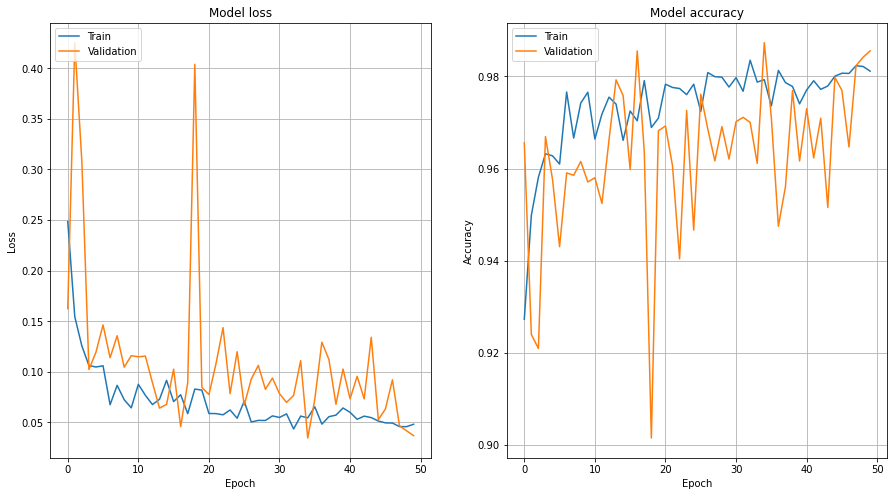

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 8))

# Plot training & validation loss values
ax1.plot(history.history['loss'])
ax1.plot(history.history['val_loss'])
ax1.set_title('Model loss')
ax1.grid()
ax1.set_ylabel('Loss')
ax1.set_xlabel('Epoch')
ax1.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation accuracy values
ax2.plot(history.history[accuracy_name])
ax2.plot(history.history[f'val_{accuracy_name}'])
ax2.set_title('Model accuracy')
ax2.grid()
ax2.set_ylabel('Accuracy')
ax2.set_xlabel('Epoch')
ax2.legend(['Train', 'Validation'], loc='upper left')
plt.show()

## Downloading a pretrained model, predictind and evaluating the model (Eff-UNet)

In [ ]:
NUMBATCHES = 1 # number of batches to display
BATCH_SIZE = 2 # size per batch -- I recommend keeping this small for better pdf output
INPUT_IMAGE_SIZE = (1024, 1024)
OUTPUT_IMAGE_SIZE = (1024, 1024)


In [ ]:
test_image_path = "/content/drive/MyDrive/Colab Data/Building Damage/test/images"
test_mask_path = "/content/drive/MyDrive/Colab Data/Building Damage/test/targets"

test_pre_image = sorted(glob.glob(os.path.join(test_image_path, "*pre*")))
test_post_image = sorted(glob.glob(os.path.join(test_image_path, "*post*")))

test_pre_mask = sorted(glob.glob(os.path.join(test_mask_path, "*pre*")))
test_post_mask = sorted(glob.glob(os.path.join(test_mask_path, "*post*")))

test_dataset = pipeline(test_pre_image)

In [ ]:
# model_name = "20230324-125803/model_20230324-125803_003_0.922.tf"
# MODEL_PATH = f"{base_path}/{folder_name}/model-checkpts/{model_name}"
# model = tf.keras.models.load_model(MODEL_PATH)

In [ ]:
train_scores = model.evaluate(train_dataset, steps=steps_per_epoch)
print("Train:")
print(f"\tLoss: {train_scores[0]:.4f}")
print(f"\tSparse Categorical Accuracy: {train_scores[1]:.4f}")

val_scores = model.evaluate(validation_dataset, steps=validation_steps)
print("Validation:")
print(f"\tLoss: {val_scores[0]:.4f}")
print(f"\tSparse Categorical Accuracy: {val_scores[1]:.4f}")

test_scores = model.evaluate(test_dataset)
print("Train:")
print(f"\tLoss: {test_scores[0]:.4f}")
print(f"\tSparse Categorical Accuracy: {test_scores[1]:.4f}")

139/139 [==============================] - 744s 5s/step - loss: 0.5100 - sparse_categorical_accuracy: 0.9023
Train:
	Loss: 0.5100
	Sparse Categorical Accuracy: 0.9023
35/35 [==============================] - 187s 5s/step - loss: 0.4663 - sparse_categorical_accuracy: 0.8932
Validation:
	Loss: 0.4663
	Sparse Categorical Accuracy: 0.8932
933/933 [==============================] - 4729s 5s/step - loss: 0.5542 - sparse_categorical_accuracy: 0.9079
Train:
	Loss: 0.5542
	Sparse Categorical Accuracy: 0.9079


In [ ]:
def plot_result(chip, mask, predmask):

  f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True, figsize=(30, 15))

  ax1.imshow(chip, alpha=1)
  ax1.set_title("Chip", fontsize=18)
  ax1.axis('off')
  
  ax2.imshow(mask[:,:,0], cmap="magma")
  ax2.imshow(chip, alpha=0.5)
  ax2.set_title("Mask", fontsize=18)
  ax2.axis('off')

  ax3.imshow(predmask, cmap="magma")
  ax3.imshow(chip, alpha=0.5)
  ax3.set_title("Prediction Mask", fontsize=18)
  ax3.axis('off')
  plt.show()

In [ ]:
def compute_metrics(y_true, y_pred, class_names):
  '''
  Computes IOU and Dice Score.

  Args:
    y_true (tensor) - ground truth label map
    y_pred (tensor) - predicted label map
  '''
  
  class_wise_iou = []
  class_wise_dice_score = []

  smoothening_factor = 0.00001

  for i in range(len(class_names)):
    intersection = np.sum((y_pred == i) * (y_true == i))
    y_true_area = np.sum((y_true == i))
    y_pred_area = np.sum((y_pred == i))
    combined_area = y_true_area + y_pred_area
    
    iou = (intersection + smoothening_factor) / (combined_area - intersection + smoothening_factor)
    class_wise_iou.append(iou)
    
    dice_score =  2 * ((intersection + smoothening_factor) / (combined_area + smoothening_factor))
    class_wise_dice_score.append(dice_score)

  iou_df = pd.DataFrame({class_name: class_wise_iou[i] * 100 for i, class_name in enumerate(class_names)}, index=["IoU Score"])
  dice_df = pd.DataFrame({class_name: class_wise_dice_score[i] * 100 for i, class_name in enumerate(class_names)}, index=["Dice Score"])
  scores = pd.concat([iou_df, dice_df], axis=0)
  scores["average_score"] = scores.iloc[:,:3].sum(axis=1)/3

  return scores

1/1 [==============================] - 11s 11s/step


<ipython-input-45-ea08011e3cee>:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  scores = scores.append(score, ignore_index=True, sort=False)


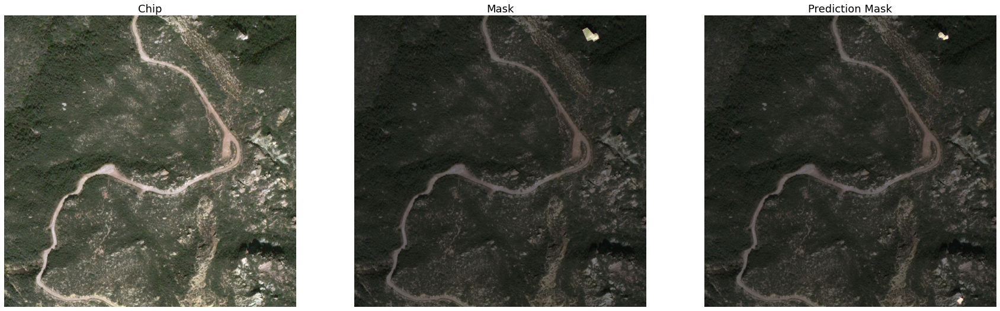

,background,buildings,average_score
IoU Score,99.87,29.56,43.14
Dice Score,99.93,45.63,48.52


<ipython-input-45-ea08011e3cee>:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  scores = scores.append(score, ignore_index=True, sort=False)


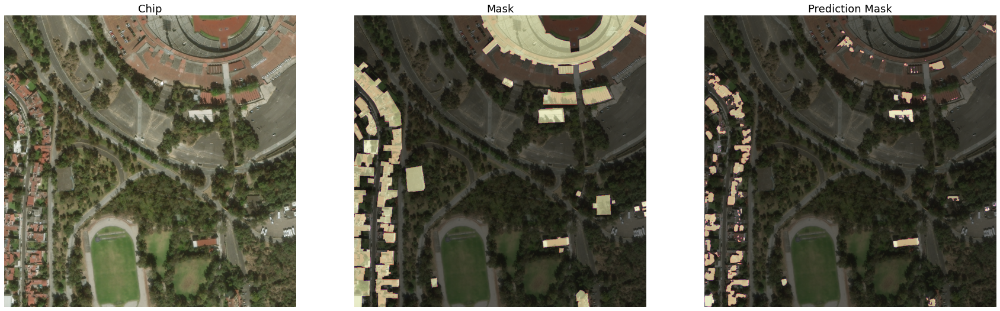

,background,buildings,average_score
IoU Score,88.05,23.88,37.31
Dice Score,93.65,38.56,44.07


<ipython-input-45-ea08011e3cee>:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  scores = scores.append(score, ignore_index=True, sort=False)


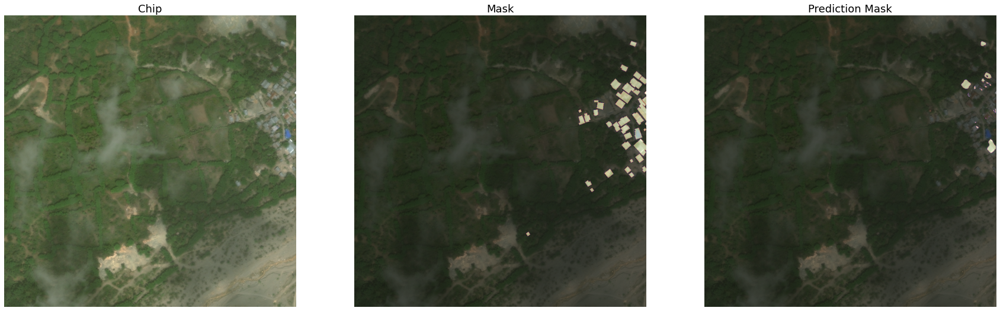

,background,buildings,average_score
IoU Score,98.45,13.27,37.24
Dice Score,99.22,23.44,40.89


<ipython-input-45-ea08011e3cee>:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  scores = scores.append(score, ignore_index=True, sort=False)


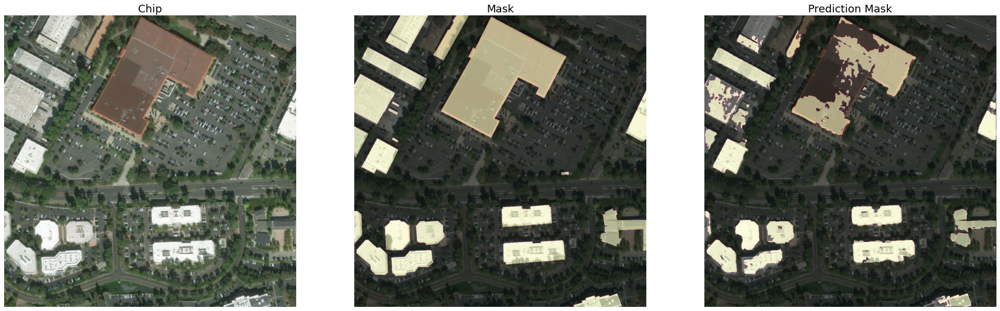

,background,buildings,average_score
IoU Score,90.56,63.69,51.42
Dice Score,95.05,77.82,57.62


<ipython-input-45-ea08011e3cee>:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  scores = scores.append(score, ignore_index=True, sort=False)


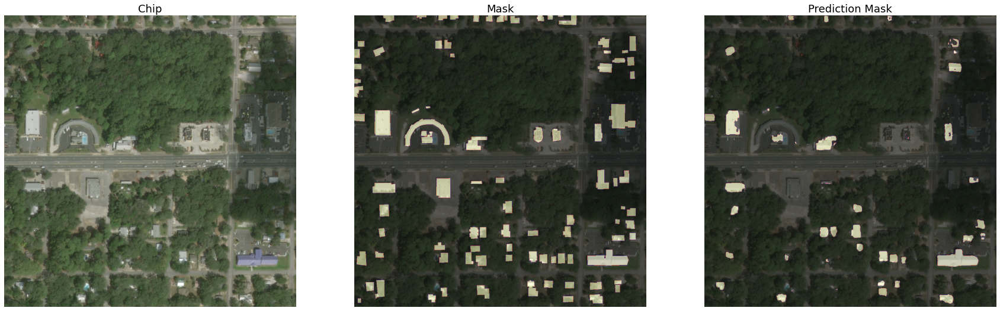

,background,buildings,average_score
IoU Score,93.67,32.44,42.04
Dice Score,96.73,48.99,48.57


<ipython-input-45-ea08011e3cee>:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  scores = scores.append(score, ignore_index=True, sort=False)


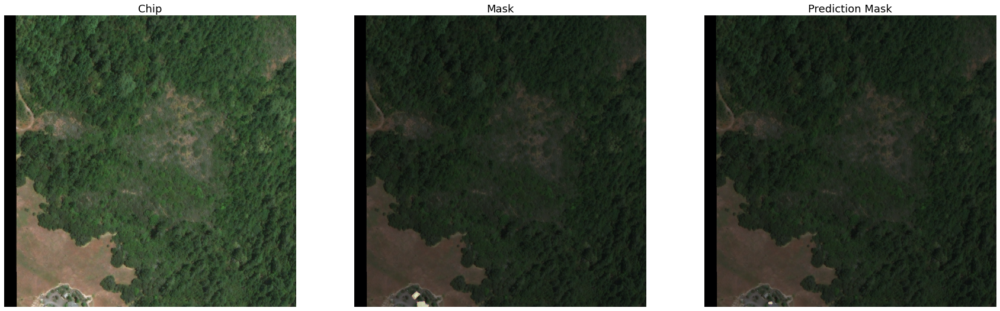

,background,buildings,average_score
IoU Score,99.91,11.68,37.19
Dice Score,99.95,20.91,40.29


<ipython-input-45-ea08011e3cee>:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  scores = scores.append(score, ignore_index=True, sort=False)


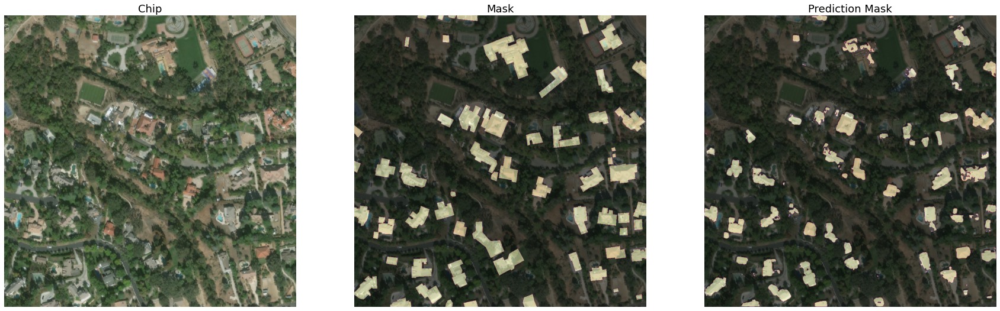

,background,buildings,average_score
IoU Score,92.12,50.62,47.58
Dice Score,95.90,67.22,54.37


<ipython-input-45-ea08011e3cee>:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  scores = scores.append(score, ignore_index=True, sort=False)


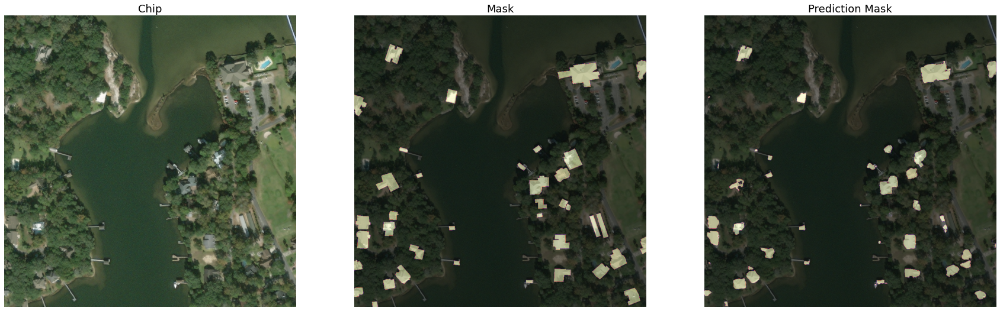

,background,buildings,average_score
IoU Score,97.32,55.78,51.03
Dice Score,98.64,71.61,56.75


<ipython-input-45-ea08011e3cee>:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  scores = scores.append(score, ignore_index=True, sort=False)


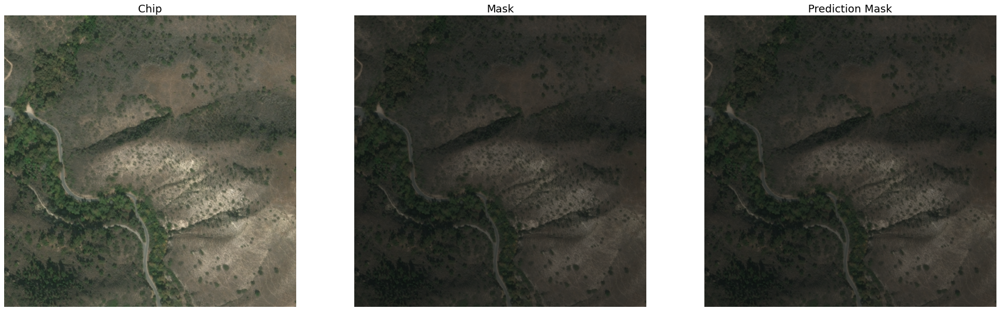

,background,buildings,average_score
IoU Score,100.0,100.0,66.67
Dice Score,100.0,200.0,100.00


<ipython-input-45-ea08011e3cee>:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  scores = scores.append(score, ignore_index=True, sort=False)


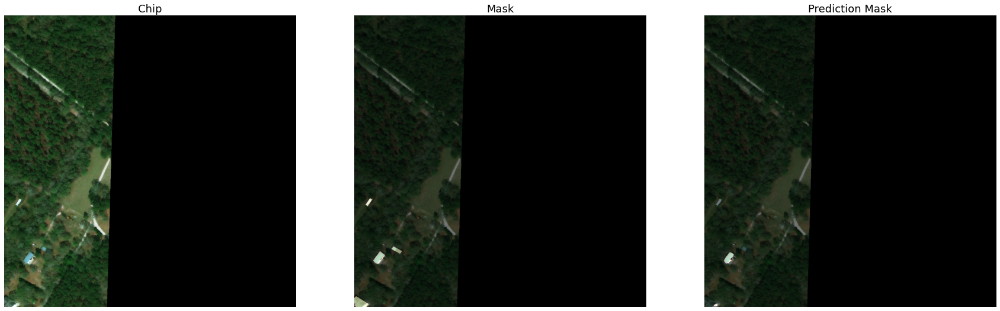

,background,buildings,average_score
IoU Score,99.8,28.69,42.83
Dice Score,99.9,44.59,48.16


In [ ]:
test_dataset = pipeline(test_pre_image, batchs=10)
iterator = iter(test_dataset)
batch = iterator.get_next()
chips, masks = batch
predictions = model.predict(chips)
predmasks = np.argmax(predictions, axis=-1)

class_names = ['background', 'buildings']
integer_slider = 0
scores = pd.DataFrame()
for chip, mask, predmask in zip(chips, masks, predmasks):

    score = compute_metrics(masks.numpy()[integer_slider], 
                            predmasks[integer_slider][:,:,np.newaxis], 
                            class_names)
    scores = scores.append(score, ignore_index=True, sort=False)
    plot_result(chip, mask, predmask)
    display(score.round(2))
    integer_slider += 1

In [ ]:
print("IoU Score")
display(scores.iloc[::2].describe())

print("Dice Score")
display(scores.iloc[1::2].describe())

IoU Score


,background,buildings,average_score
count,10.000000,10.000000,10.000000
mean,95.974779,40.962010,45.645596
std,4.492529,27.047434,9.108489
min,88.050323,11.675580,37.193686
25%,92.510134,25.085937,38.492780
50%,97.885059,31.000999,42.986482
75%,99.851991,54.491319,50.169986
max,100.000000,100.000000,66.666667


Dice Score


,background,buildings,average_score
count,10.000000,10.000000,10.000000
mean,97.897108,63.876662,53.924590
std,2.372531,51.471672,17.285041
min,93.645490,20.909818,40.287512
25%,96.108121,40.066436,45.091825
50%,98.930394,47.310861,48.547684
75%,99.925938,70.515395,56.156893
max,100.000000,200.000000,100.000000
